In [3]:
import pandas as pd 
import missingno as msno 
import matplotlib.pyplot as plt
import seaborn as sns 

In [4]:
data= pd.read_csv("https://archive.ics.uci.edu/ml/machine-learning-databases/00272/SkillCraft1_Dataset.csv")

In [ ]:
data

,GameID,LeagueIndex,Age,HoursPerWeek,TotalHours,APM,SelectByHotkeys,AssignToHotkeys,UniqueHotkeys,MinimapAttacks,MinimapRightClicks,NumberOfPACs,GapBetweenPACs,ActionLatency,ActionsInPAC,TotalMapExplored,WorkersMade,UniqueUnitsMade,ComplexUnitsMade,ComplexAbilitiesUsed
0,52,5,27,10,3000,143.7180,0.003515,0.000220,7,0.000110,0.000392,0.004849,32.6677,40.8673,4.7508,28,0.001397,6,0.000000,0.000000
1,55,5,23,10,5000,129.2322,0.003304,0.000259,4,0.000294,0.000432,0.004307,32.9194,42.3454,4.8434,22,0.001194,5,0.000000,0.000208
2,56,4,30,10,200,69.9612,0.001101,0.000336,4,0.000294,0.000461,0.002926,44.6475,75.3548,4.0430,22,0.000745,6,0.000000,0.000189
3,57,3,19,20,400,107.6016,0.001034,0.000213,1,0.000053,0.000543,0.003783,29.2203,53.7352,4.9155,19,0.000426,7,0.000000,0.000384
4,58,3,32,10,500,122.8908,0.001136,0.000327,2,0.000000,0.001329,0.002368,22.6885,62.0813,9.3740,15,0.001174,4,0.000000,0.000019
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3390,10089,8,?,?,?,259.6296,0.020425,0.000743,9,0.000621,0.000146,0.004555,18.6059,42.8342,6.2754,46,0.000877,5,0.000000,0.000000
3391,10090,8,?,?,?,314.6700,0.028043,0.001157,10,0.000246,0.001083,0.004259,14.3023,36.1156,7.1965,16,0.000788,4,0.000000,0.000000
3392,10092,8,?,?,?,299.4282,0.028341,0.000860,7,0.000338,0.000169,0.004439,12.4028,39.5156,6.3979,19,0.001260,4,0.000000,0.000000
3393,10094,8,?,?,?,375.8664,0.036436,0.000594,5,0.000204,0.000780,0.004346,11.6910,34.8547,7.9615,15,0.000613,6,0.000000,0.000631


In [ ]:
data.info() # des colonnes comme age ou nb d'heures qui devrai etre int sont des object, bizarre missing value ?


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3395 entries, 0 to 3394
Data columns (total 20 columns):
GameID                  3395 non-null int64
LeagueIndex             3395 non-null int64
Age                     3395 non-null object
HoursPerWeek            3395 non-null object
TotalHours              3395 non-null object
APM                     3395 non-null float64
SelectByHotkeys         3395 non-null float64
AssignToHotkeys         3395 non-null float64
UniqueHotkeys           3395 non-null int64
MinimapAttacks          3395 non-null float64
MinimapRightClicks      3395 non-null float64
NumberOfPACs            3395 non-null float64
GapBetweenPACs          3395 non-null float64
ActionLatency           3395 non-null float64
ActionsInPAC            3395 non-null float64
TotalMapExplored        3395 non-null int64
WorkersMade             3395 non-null float64
UniqueUnitsMade         3395 non-null int64
ComplexUnitsMade        3395 non-null float64
ComplexAbilitiesUsed    3395 non

In [ ]:
data.shape

(3395, 20)

In [ ]:
data.describe().T

,count,mean,std,min,25%,50%,75%,max
GameID,3395.0,4805.012371,2719.944851,52.000000,2464.500000,4874.000000,7108.500000,10095.000000
LeagueIndex,3395.0,4.184094,1.517327,1.000000,3.000000,4.000000,5.000000,8.000000
APM,3395.0,117.046947,51.945291,22.059600,79.900200,108.010200,142.790400,389.831400
SelectByHotkeys,3395.0,0.004299,0.005284,0.000000,0.001258,0.002500,0.005133,0.043088
AssignToHotkeys,3395.0,0.000374,0.000225,0.000000,0.000204,0.000353,0.000499,0.001752
UniqueHotkeys,3395.0,4.364654,2.360333,0.000000,3.000000,4.000000,6.000000,10.000000
MinimapAttacks,3395.0,0.000098,0.000166,0.000000,0.000000,0.000040,0.000119,0.003019
MinimapRightClicks,3395.0,0.000387,0.000377,0.000000,0.000140,0.000281,0.000514,0.004041
NumberOfPACs,3395.0,0.003463,0.000992,0.000679,0.002754,0.003395,0.004027,0.007971
GapBetweenPACs,3395.0,40.361562,17.153570,6.666700,28.957750,36.723500,48.290500,237.142900


In [ ]:
data.Age # okay donc on as des valeurs manquante representé par un ?     
# si on change vaux mieux mettre la missing value egale a la mediane car elle est moins sensible au valeurs extreme 

0       27
1       23
2       30
3       19
4       32
        ..
3390     ?
3391     ?
3392     ?
3393     ?
3394     ?
Name: Age, Length: 3395, dtype: object

In [ ]:
data.HoursPerWeek # on as aussi les ? pour representé les valeurs manquante, ca veux dire que c'est 0? au final non vus que c'est des pros (surment trop des heures sur different comptes)


0       10
1       10
2       10
3       20
4       10
        ..
3390     ?
3391     ?
3392     ?
3393     ?
3394     ?
Name: HoursPerWeek, Length: 3395, dtype: object

In [ ]:
data.Age.value_counts() # 55 missing value 

20    357
21    344
18    325
22    314
19    313
23    259
16    256
17    248
24    225
25    168
26    136
27    111
28     73
?      55
29     52
30     32
31     29
32     21
35     17
33     15
34     15
36      8
38      5
37      5
40      4
41      3
39      3
44      1
43      1
Name: Age, dtype: int64

In [ ]:
data.HoursPerWeek.value_counts() # 56 missing value 

10     411
8      390
20     335
12     331
6      323
28     280
24     233
16     223
4      219
14     181
2      108
42      92
?       56
30      54
36      50
56      33
18      24
40      12
70       9
48       7
50       5
32       5
84       2
96       2
60       2
168      1
0        1
80       1
140      1
112      1
98       1
72       1
90       1
Name: HoursPerWeek, dtype: int64

In [ ]:
count=0
miss=data.TotalHours=='?'
for i in range(len(miss)):
  if miss[i] == True:
    count+=1
print(count)
# ici on as 57 missing values 

57


# Traiter les valeurs manquantes
on vas s'aider de ce site https://towardsdatascience.com/7-ways-to-handle-missing-values-in-machine-learning-1a6326adf79e 

In [5]:
data["Age"] = [None if x=="?" else x for x in data["Age"]]
data["HoursPerWeek"] = [None if x=="?" else x for x in data["HoursPerWeek"]]
data["TotalHours"] = [None if x=="?" else x for x in data["TotalHours"]]

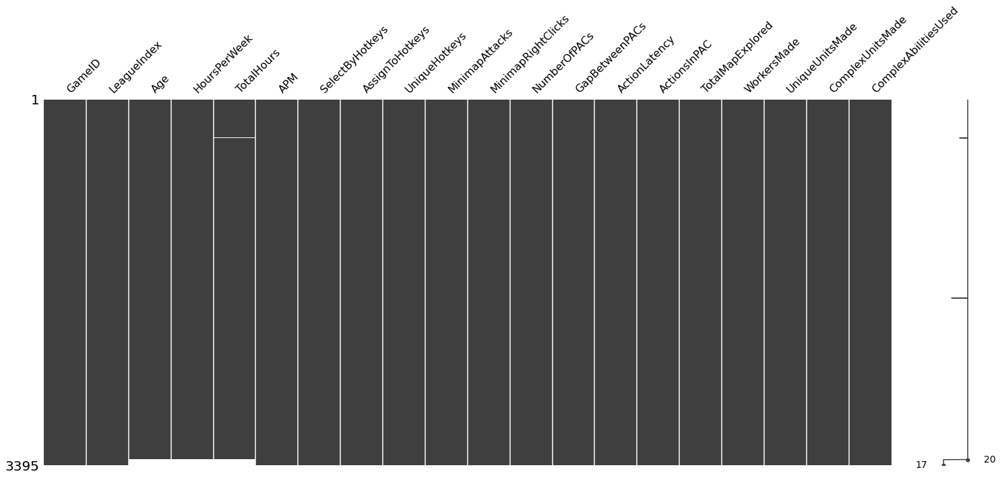

In [6]:
msno.matrix(data) # comme ça on peut voir ou sont situé les valeurs manquante représenté par les ?

on peut voir que dans la plupart des cas si une observation à une missing value dans la colonne Age elle as aussi une missing value dans HoursPerWeek et dans TotalHours donc il est okay de les drops aussi parce que il y a peu de missing value par rapport au nombre total d'observation 

**pros:**  
*   A model trained with the removal of all missing values creates a robust model.

**Cons:**
*   Loss of a lot of information.
*   Works poorly if the percentage of missing values is excessive in comparison to the complete dataset. (ceci est pas vraiment notre cas 



la seule question qu'on peut se poser c'est si on a HoursPerWeek ne pourrons on pas inputer TotalHours (on peut pas on as pas d'autres valeurs pour la trouver )

In [7]:
data= pd.read_csv("https://archive.ics.uci.edu/ml/machine-learning-databases/00272/SkillCraft1_Dataset.csv") # comme ca on repart sur de bonnes bases 
data

,GameID,LeagueIndex,Age,HoursPerWeek,TotalHours,APM,SelectByHotkeys,AssignToHotkeys,UniqueHotkeys,MinimapAttacks,MinimapRightClicks,NumberOfPACs,GapBetweenPACs,ActionLatency,ActionsInPAC,TotalMapExplored,WorkersMade,UniqueUnitsMade,ComplexUnitsMade,ComplexAbilitiesUsed
0,52,5,27,10,3000,143.7180,0.003515,0.000220,7,0.000110,0.000392,0.004849,32.6677,40.8673,4.7508,28,0.001397,6,0.000000,0.000000
1,55,5,23,10,5000,129.2322,0.003304,0.000259,4,0.000294,0.000432,0.004307,32.9194,42.3454,4.8434,22,0.001194,5,0.000000,0.000208
2,56,4,30,10,200,69.9612,0.001101,0.000336,4,0.000294,0.000461,0.002926,44.6475,75.3548,4.0430,22,0.000745,6,0.000000,0.000189
3,57,3,19,20,400,107.6016,0.001034,0.000213,1,0.000053,0.000543,0.003783,29.2203,53.7352,4.9155,19,0.000426,7,0.000000,0.000384
4,58,3,32,10,500,122.8908,0.001136,0.000327,2,0.000000,0.001329,0.002368,22.6885,62.0813,9.3740,15,0.001174,4,0.000000,0.000019
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3390,10089,8,?,?,?,259.6296,0.020425,0.000743,9,0.000621,0.000146,0.004555,18.6059,42.8342,6.2754,46,0.000877,5,0.000000,0.000000
3391,10090,8,?,?,?,314.6700,0.028043,0.001157,10,0.000246,0.001083,0.004259,14.3023,36.1156,7.1965,16,0.000788,4,0.000000,0.000000
3392,10092,8,?,?,?,299.4282,0.028341,0.000860,7,0.000338,0.000169,0.004439,12.4028,39.5156,6.3979,19,0.001260,4,0.000000,0.000000
3393,10094,8,?,?,?,375.8664,0.036436,0.000594,5,0.000204,0.000780,0.004346,11.6910,34.8547,7.9615,15,0.000613,6,0.000000,0.000631


In [ ]:

grandMaster = data[data['LeagueIndex'] == 7 ] # on prend que les grand master

ageGM=grandMaster.Age.value_counts().to_dict()     #on fait comme ça parce que il y a pas de league propre pour les pros du coup les pros sont des grands master
agecommun=0
effectifmax=0
for age,effectif in ageGM.items():
  if effectif>effectifmax:
    effectifmax=effectif
    agecommun=age
#agecommun 

hoursGM=grandMaster.HoursPerWeek.value_counts().to_dict()
hourscommun=0
effectifmax=0
for hours,effectif in hoursGM.items():
  if effectif>effectifmax:
    effectifmax=effectif
    hourscommun=hours
#print(hourscommun)

totGM=grandMaster.TotalHours.value_counts().to_dict()
hourstotcommun=0
effectifmax=0
for hours,effectif in totGM.items():
  if effectif>effectifmax:
    effectifmax=effectif
    hourstotcommun=hours
#print(hourstotcommun)

data["Age"] = [pd.NaT if x=="?" else x for x in data["Age"]]
data["HoursPerWeek"] = [pd.NaT if x=="?" else x for x in data["HoursPerWeek"]]
data["TotalHours"] = [pd.NaT if x=="?" else x for x in data["TotalHours"]]

data["Age"] = data.Age.fillna(agecommun)
data["HoursPerWeek"] = data.HoursPerWeek.fillna(hourscommun)
data["TotalHours"] =  data.TotalHours.fillna(hourstotcommun)

In [ ]:
data

,GameID,LeagueIndex,Age,HoursPerWeek,TotalHours,APM,SelectByHotkeys,AssignToHotkeys,UniqueHotkeys,MinimapAttacks,MinimapRightClicks,NumberOfPACs,GapBetweenPACs,ActionLatency,ActionsInPAC,TotalMapExplored,WorkersMade,UniqueUnitsMade,ComplexUnitsMade,ComplexAbilitiesUsed
0,52,5,27,10,3000,143.7180,0.003515,0.000220,7,0.000110,0.000392,0.004849,32.6677,40.8673,4.7508,28,0.001397,6,0.000000,0.000000
1,55,5,23,10,5000,129.2322,0.003304,0.000259,4,0.000294,0.000432,0.004307,32.9194,42.3454,4.8434,22,0.001194,5,0.000000,0.000208
2,56,4,30,10,200,69.9612,0.001101,0.000336,4,0.000294,0.000461,0.002926,44.6475,75.3548,4.0430,22,0.000745,6,0.000000,0.000189
3,57,3,19,20,400,107.6016,0.001034,0.000213,1,0.000053,0.000543,0.003783,29.2203,53.7352,4.9155,19,0.000426,7,0.000000,0.000384
4,58,3,32,10,500,122.8908,0.001136,0.000327,2,0.000000,0.001329,0.002368,22.6885,62.0813,9.3740,15,0.001174,4,0.000000,0.000019
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3390,10089,8,23,56,500,259.6296,0.020425,0.000743,9,0.000621,0.000146,0.004555,18.6059,42.8342,6.2754,46,0.000877,5,0.000000,0.000000
3391,10090,8,23,56,500,314.6700,0.028043,0.001157,10,0.000246,0.001083,0.004259,14.3023,36.1156,7.1965,16,0.000788,4,0.000000,0.000000
3392,10092,8,23,56,500,299.4282,0.028341,0.000860,7,0.000338,0.000169,0.004439,12.4028,39.5156,6.3979,19,0.001260,4,0.000000,0.000000
3393,10094,8,23,56,500,375.8664,0.036436,0.000594,5,0.000204,0.000780,0.004346,11.6910,34.8547,7.9615,15,0.000613,6,0.000000,0.000631


In [ ]:
data.Age.value_counts() #plus de missing value 

20    357
21    344
18    324
22    314
19    313
23    259
16    256
17    247
24    225
25    168
26    136
27    111
28     73
29     52
30     32
31     29
32     21
35     17
34     15
33     15
36      8
37      5
38      5
40      4
41      3
39      3
43      1
44      1
Name: Age, dtype: int64

In [ ]:
data.dtypes

GameID                    int64
LeagueIndex               int64
Age                       int64
HoursPerWeek              int64
TotalHours                int64
APM                     float64
SelectByHotkeys         float64
AssignToHotkeys         float64
UniqueHotkeys             int64
MinimapAttacks          float64
MinimapRightClicks      float64
NumberOfPACs            float64
GapBetweenPACs          float64
ActionLatency           float64
ActionsInPAC            float64
TotalMapExplored          int64
WorkersMade             float64
UniqueUnitsMade           int64
ComplexUnitsMade        float64
ComplexAbilitiesUsed    float64
dtype: object

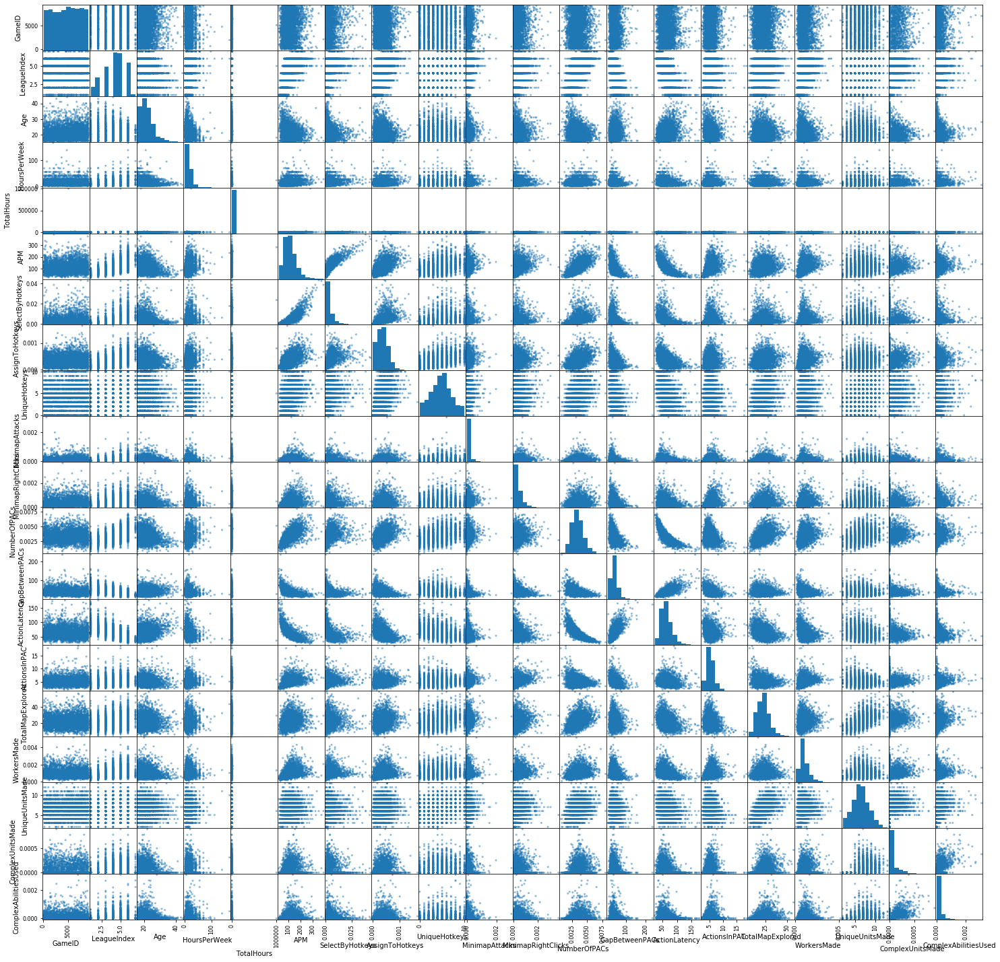

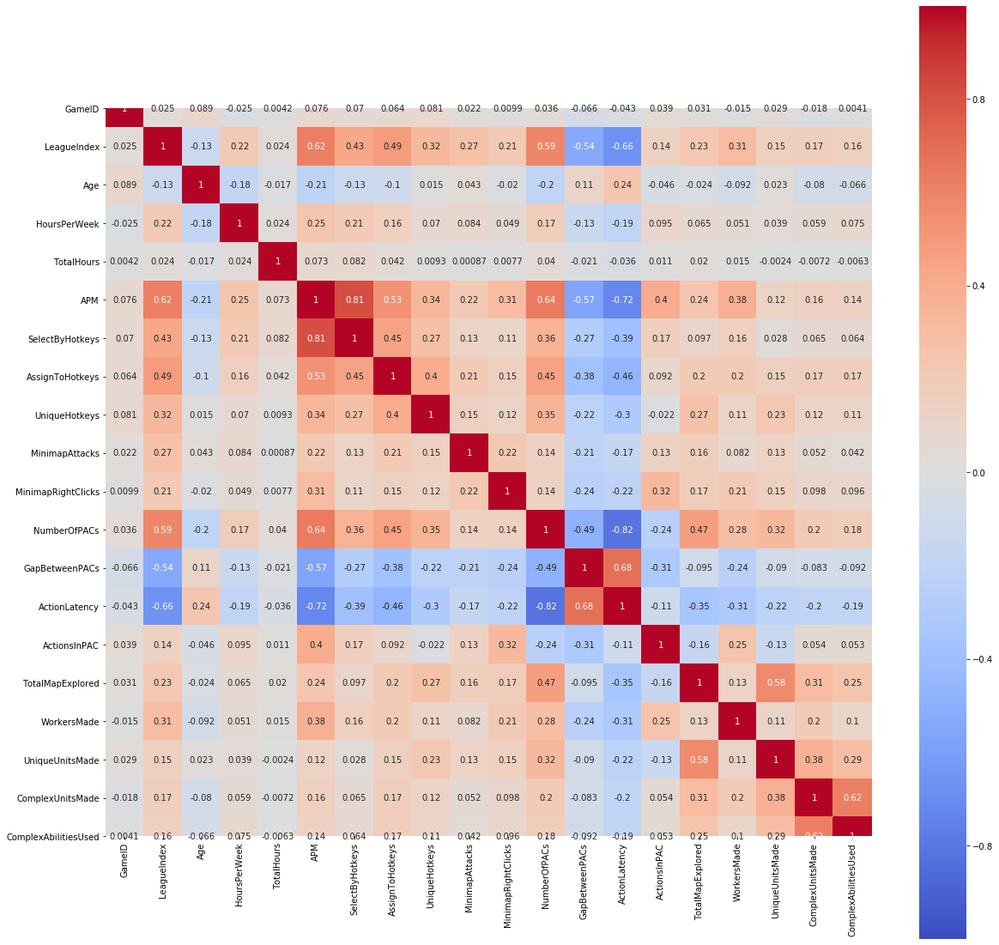

In [ ]:
infos = pd.plotting.scatter_matrix(data, figsize=(25,25))
infos

plt.figure(figsize=(20,20))
sns.heatmap(data.corr("pearson"),
            vmin=-1, vmax=1,
            cmap='coolwarm',
            annot=True, 
            square=True)

league index a une forte corrélation avec l'apm, NumberOfPACS, GapBetweenPACs, ActionLatency on peut donc supposer que ces features auront une forte importance dans le model (attenion, numbers of pacs et Actio lattency sont fortement corrélée donc on peut supposer que ces variables définissent a peu pres la meme chose)

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


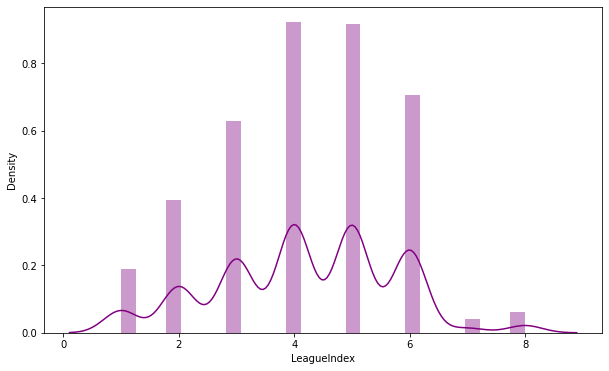

In [ ]:

plt.figure(figsize=(10,6))
sns.distplot(data['LeagueIndex'],color='purple')
plt.show()

la majorité des joueurs font partie du 3/4/5/6 ( gaussienne autour de 4,5)

[]

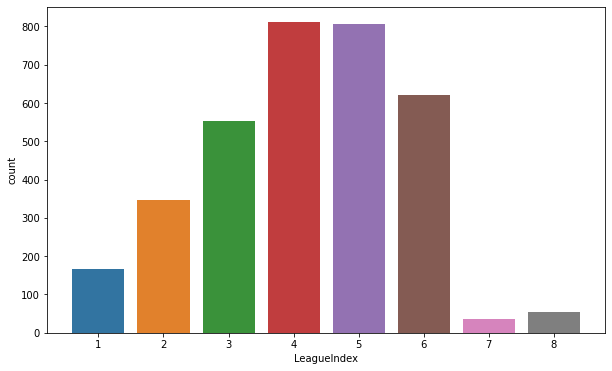

In [ ]:
plt.figure(figsize=(10,6))
sns.countplot(data=data,x='LeagueIndex')
plt.plot()

le plus haut ranking represente a peine 0.05 des joueurs 

[]

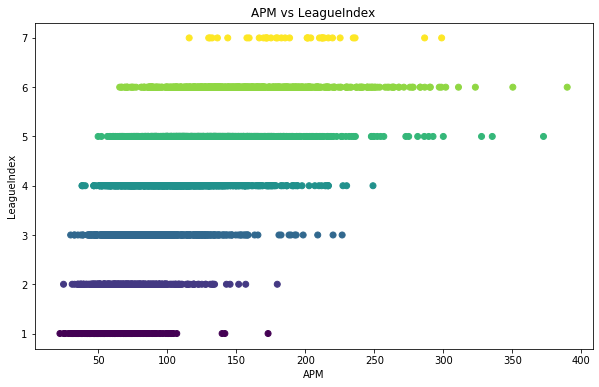

In [ ]:
plt.figure(figsize=(10,6))

plt.scatter(data['APM'],data['LeagueIndex'],c=data['LeagueIndex'])
plt.colorbar
plt.title('APM vs LeagueIndex' )
plt.xlabel('APM')
plt.ylabel('LeagueIndex')
plt.plot()

comme attendu plus l'apm est élévée plus on a les capacitées pour avoir un rang élevée 

[]

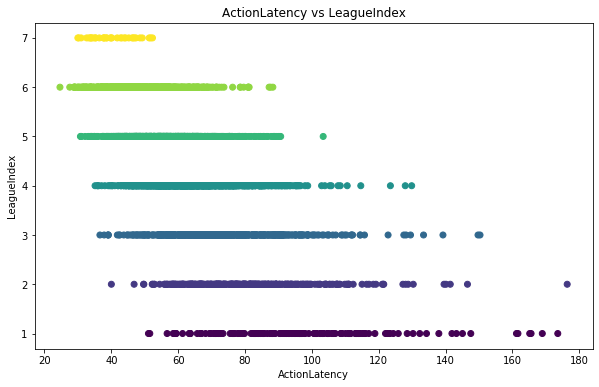

In [ ]:
plt.figure(figsize=(10,6))

plt.scatter(data['ActionLatency'],data['LeagueIndex'],c=data['LeagueIndex'])
plt.colorbar
plt.title('ActionLatency vs LeagueIndex' )
plt.xlabel('ActionLatency')
plt.ylabel('LeagueIndex')
plt.plot()

la meme chose inversement avec l'action lattency. Plus on est lent a faire des actions, moins on a de chance d'avoir un haut rang. De ce fait quelqu'un avec une action lattency tres faible (30) ne peut pas etre bronze 

[]

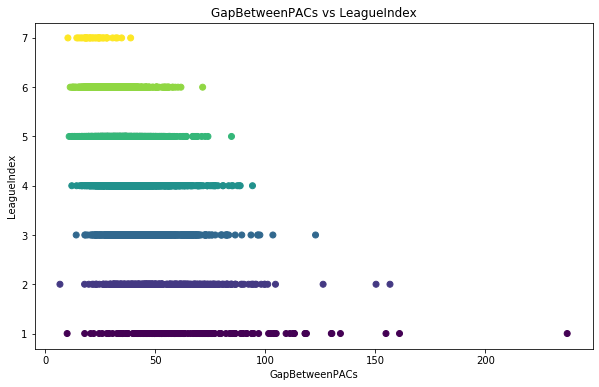

In [ ]:
plt.figure(figsize=(10,6))

plt.scatter(data['GapBetweenPACs'],data['LeagueIndex'],c=data['LeagueIndex'])
plt.colorbar
plt.title('GapBetweenPACs vs LeagueIndex' )
plt.xlabel('GapBetweenPACs')
plt.ylabel('LeagueIndex')
plt.plot()

on observe moins de grosse difference avec peut etre quelque outlayers qui ont un gap tres elevé par rapport a la mojorité des joueurs et se situent vers  le bas du classement
on en deduit qu'il n'ont pas vrm de compatibilité avec les jeux videos.

[]

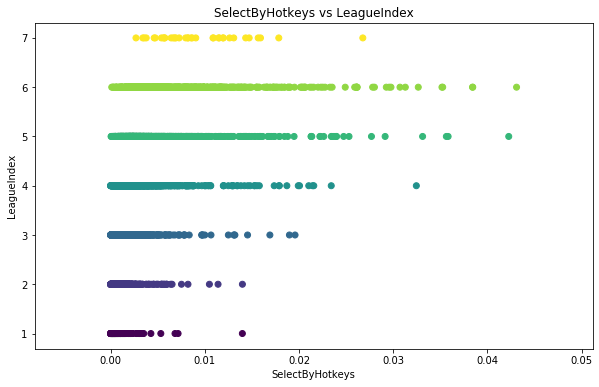

In [ ]:
plt.figure(figsize=(10,6))

plt.scatter(data['SelectByHotkeys'],data['LeagueIndex'],c=data['LeagueIndex'])
plt.colorbar
plt.title('SelectByHotkeys vs LeagueIndex' )
plt.xlabel('SelectByHotkeys')
plt.ylabel('LeagueIndex')
plt.plot()

dans certains pas mal de cas sela ne change rien mais on observe quand meme une tendance, utilisé des racccourcis favorise un tant soit peu la monté en ranking, les grand-masteur(7) sont sous représentées ce qui pourrait indiqué leurs positions dans leurs graphique. On retient qu'un joueur sans hotkeys peut tres bien avoir un haut ranking.

[]

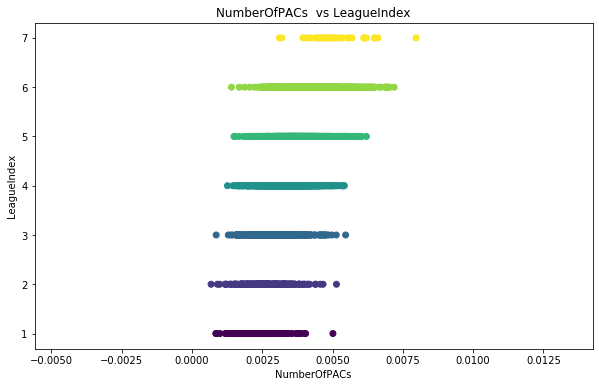

In [ ]:
plt.figure(figsize=(10,6))

plt.scatter(data['NumberOfPACs'],data['LeagueIndex'],c=data['LeagueIndex'])
plt.colorbar
plt.title('NumberOfPACs  vs LeagueIndex' )
plt.xlabel('NumberOfPACs')
plt.ylabel('LeagueIndex')
plt.plot()

ici on ne peut rien en tirer

les variables les plus importante a premiere vue pour séparer les ranking vont être : APM,ActionLatency,GapBetweenPACs,SelectByHotkeys

In [ ]:
X.head()

,Age,HoursPerWeek,TotalHours,APM,SelectByHotkeys,AssignToHotkeys,UniqueHotkeys,MinimapAttacks,MinimapRightClicks,NumberOfPACs,GapBetweenPACs,ActionLatency,ActionsInPAC,TotalMapExplored,WorkersMade,UniqueUnitsMade,ComplexUnitsMade,ComplexAbilitiesUsed
0,27,10,3000,143.7180,0.003515,0.000220,7,0.000110,0.000392,0.004849,32.6677,40.8673,4.7508,28,0.001397,6,0.0,0.000000
1,23,10,5000,129.2322,0.003304,0.000259,4,0.000294,0.000432,0.004307,32.9194,42.3454,4.8434,22,0.001194,5,0.0,0.000208
2,30,10,200,69.9612,0.001101,0.000336,4,0.000294,0.000461,0.002926,44.6475,75.3548,4.0430,22,0.000745,6,0.0,0.000189
3,19,20,400,107.6016,0.001034,0.000213,1,0.000053,0.000543,0.003783,29.2203,53.7352,4.9155,19,0.000426,7,0.0,0.000384
4,32,10,500,122.8908,0.001136,0.000327,2,0.000000,0.001329,0.002368,22.6885,62.0813,9.3740,15,0.001174,4,0.0,0.000019


In [ ]:
data=data.drop(data[data.TotalHours == 1000000].index) # on supprime ca parce que c'est une valeure tres tres extreme
data=data.drop(data[data.GapBetweenPACs >= 230].index)
data=data.drop(data[data.MinimapAttacks >= 0.0019].index)

In [ ]:
data.describe().T

,count,mean,std,min,25%,50%,75%,max
GameID,3392.0,4806.415684,2720.145786,52.000000,2464.750000,4879.000000,7111.500000,10095.000000
LeagueIndex,3392.0,4.184552,1.516883,1.000000,3.000000,4.000000,5.000000,8.000000
Age,3392.0,21.673054,4.175748,16.000000,19.000000,21.000000,24.000000,44.000000
HoursPerWeek,3392.0,16.567807,12.920719,0.000000,8.000000,12.000000,20.000000,168.000000
TotalHours,3392.0,658.522406,849.569290,3.000000,300.000000,500.000000,800.000000,25000.000000
APM,3392.0,117.019393,51.873248,22.059600,79.936800,108.006300,142.789800,389.831400
SelectByHotkeys,3392.0,0.004295,0.005276,0.000000,0.001258,0.002498,0.005132,0.043088
AssignToHotkeys,3392.0,0.000374,0.000225,0.000000,0.000204,0.000353,0.000499,0.001752
UniqueHotkeys,3392.0,4.365271,2.359995,0.000000,3.000000,4.000000,6.000000,10.000000
MinimapAttacks,3392.0,0.000097,0.000158,0.000000,0.000000,0.000040,0.000119,0.001974


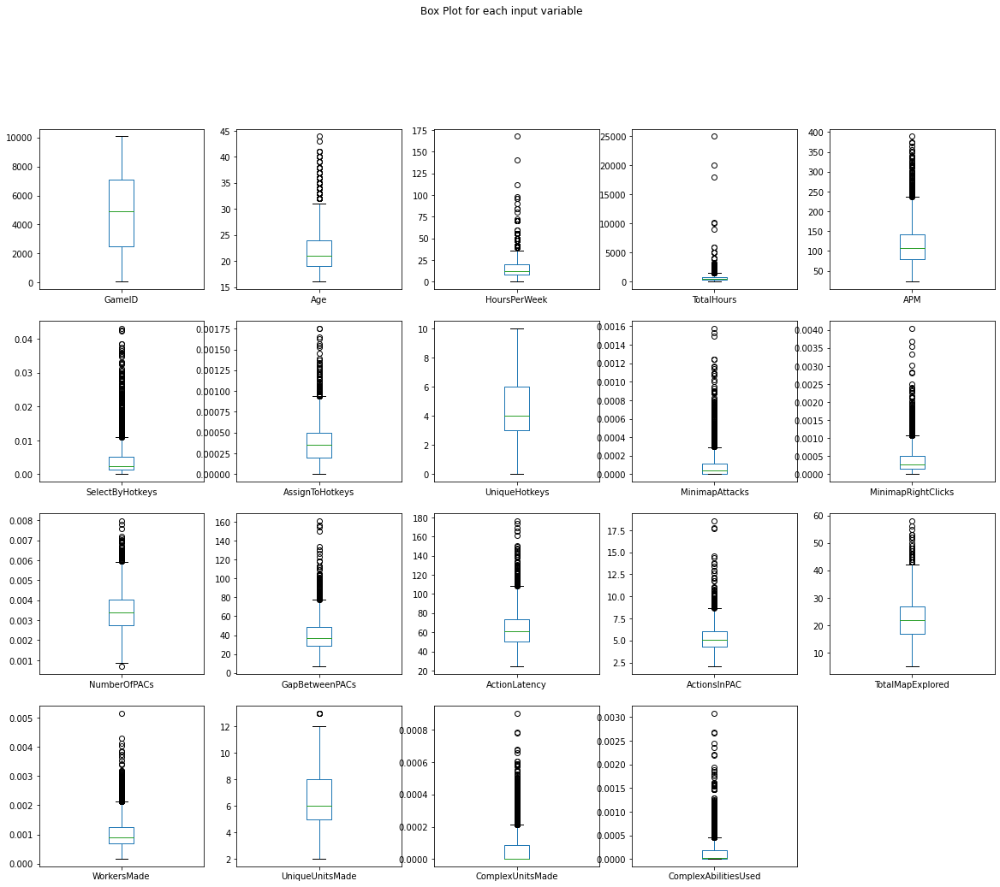

In [ ]:
data.drop('LeagueIndex', axis=1).plot(kind='box', subplots=True, layout=(5,5), sharex=False, sharey=False, figsize=(20,20), 
                                        title='Box Plot for each input variable')
plt.savefig('distribution')
plt.show()

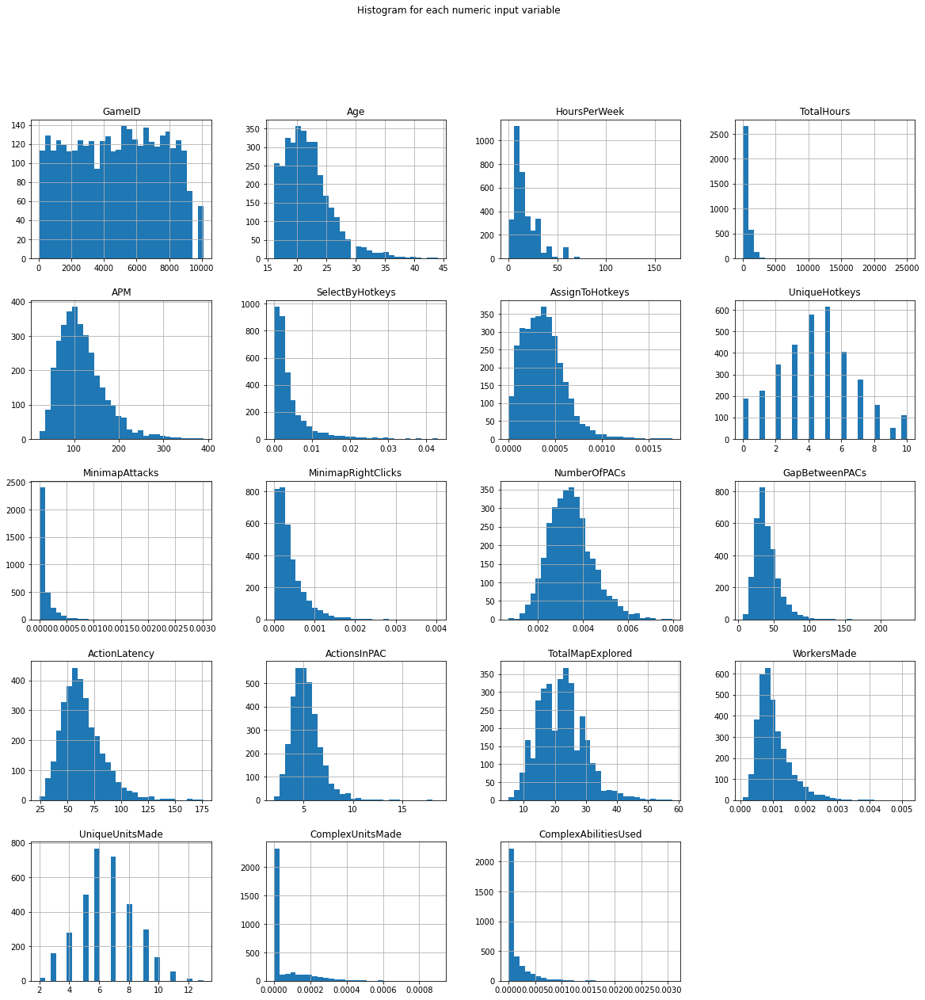

In [ ]:
import pylab as pl
data.drop('LeagueIndex' ,axis=1).hist(bins=30, figsize=(20,20))
pl.suptitle("Histogram for each numeric input variable")
plt.savefig('fruits_hist')
plt.show()

In [ ]:
data.TotalHours.describe().T


count     3394.000000
mean       658.334708
std        849.377506
min          3.000000
25%        300.000000
50%        500.000000
75%        800.000000
max      25000.000000
Name: TotalHours, dtype: float64

In [ ]:
feature_names = list(data.drop('LeagueIndex',axis=1).columns)
Xa = data[feature_names]
ya = data['LeagueIndex']

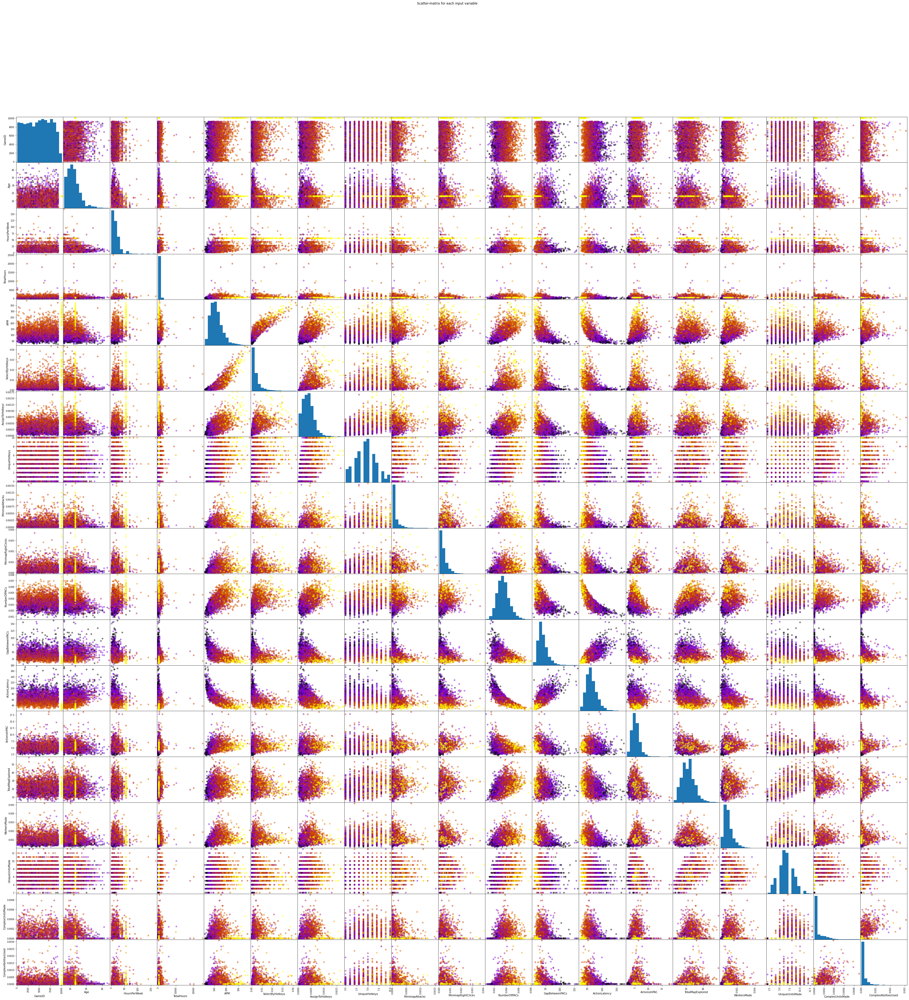

In [ ]:

from matplotlib import cm


cmap = cm.get_cmap('gnuplot')
scatter = pd.plotting.scatter_matrix(Xa, c = ya, marker = 'o', s=40, hist_kwds={'bins':15}, figsize=(60,60), cmap = cmap)
plt.suptitle('Scatter-matrix for each input variable')
plt.savefig('data_scatter_matrix')

In [ ]:
print(list(data.columns))


['GameID', 'LeagueIndex', 'Age', 'HoursPerWeek', 'TotalHours', 'APM', 'SelectByHotkeys', 'AssignToHotkeys', 'UniqueHotkeys', 'MinimapAttacks', 'MinimapRightClicks', 'NumberOfPACs', 'GapBetweenPACs', 'ActionLatency', 'ActionsInPAC', 'TotalMapExplored', 'WorkersMade', 'UniqueUnitsMade', 'ComplexUnitsMade', 'ComplexAbilitiesUsed']


In [ ]:


from sklearn.model_selection import train_test_split
X_trainjv, X_testjv, y_trainjv, y_testjv = train_test_split(Xa, ya, random_state=0)

from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()
X_trainjv = scaler.fit_transform(X_trainjv)
X_testjv = scaler.transform(X_testjv)


## logistic regression 

In [ ]:
from sklearn.linear_model import LogisticRegression
logreg = LogisticRegression()
logreg.fit(X_trainjv, y_trainjv)



/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py:940: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)


LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=None, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)

In [ ]:

print('Accuracy of Logistic regression classifier on training set: {:.2f}'
     .format(logreg.score(X_trainjv, y_trainjv)))
print('Accuracy of Logistic regression classifier on test set: {:.2f}'    # important de noter que le score de sklearn de base c'est le R2
     .format(logreg.score(X_testjv, y_testjv)))

Accuracy of Logistic regression classifier on training set: 0.43
Accuracy of Logistic regression classifier on test set: 0.41


## decision tree 

In [ ]:
from sklearn.tree import DecisionTreeClassifier
clf = DecisionTreeClassifier().fit(X_trainjv, y_trainjv)

print('Accuracy of Decision Tree classifier on training set: {:.2f}'
     .format(clf.score(X_trainjv, y_trainjv)))
print('Accuracy of Decision Tree classifier on test set: {:.2f}'
     .format(clf.score(X_testjv, y_testjv)))

Accuracy of Decision Tree classifier on training set: 1.00
Accuracy of Decision Tree classifier on test set: 0.32


## K-Nearest Neighbors 


In [ ]:
from sklearn.neighbors import KNeighborsClassifier
knn = KNeighborsClassifier()
knn.fit(X_trainjv, y_trainjv)
print('Accuracy of K-NN classifier on training set: {:.2f}'
     .format(knn.score(X_trainjv, y_trainjv)))
print('Accuracy of K-NN classifier on test set: {:.2f}'
     .format(knn.score(X_testjv, y_testjv)))

Accuracy of K-NN classifier on training set: 0.55
Accuracy of K-NN classifier on test set: 0.33


## Linear Discriminant Analysis 

In [ ]:
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
lda = LinearDiscriminantAnalysis()
lda.fit(X_trainjv, y_trainjv)
print('Accuracy of LDA classifier on training set: {:.2f}'
     .format(lda.score(X_trainjv, y_trainjv)))
print('Accuracy of LDA classifier on test set: {:.2f}'
     .format(lda.score(X_testjv, y_testjv)))

Accuracy of LDA classifier on training set: 0.43
Accuracy of LDA classifier on test set: 0.40


## Gaussian Naive Bayes  

In [ ]:
from sklearn.naive_bayes import GaussianNB
gnb = GaussianNB()
gnb.fit(X_trainjv, y_trainjv)
print('Accuracy of GNB classifier on training set: {:.2f}'
     .format(gnb.score(X_trainjv, y_trainjv)))
print('Accuracy of GNB classifier on test set: {:.2f}'
     .format(gnb.score(X_testjv, y_testjv)))

Accuracy of GNB classifier on training set: 0.38
Accuracy of GNB classifier on test set: 0.34


## Support Vector Machine

In [ ]:
from sklearn.svm import SVC
svm = SVC()
svm.fit(X_trainjv, y_trainjv)
print('Accuracy of SVM classifier on training set: {:.2f}'
     .format(svm.score(X_trainjv, y_trainjv)))
print('Accuracy of SVM classifier on test set: {:.2f}'
     .format(svm.score(X_testjv, y_testjv)))

Accuracy of SVM classifier on training set: 0.48
Accuracy of SVM classifier on test set: 0.41


## Random forest 

In [ ]:
from sklearn.ensemble import RandomForestClassifier

classifier = RandomForestClassifier(max_depth=8, random_state=0)

classifier.fit(X_trainjv, y_trainjv)
print('Accuracy of Decision Tree classifier on training set: {:.2f}'
     .format(classifier.score(X_trainjv, y_trainjv)))
print('Accuracy of Decision Tree classifier on test set: {:.2f}'
     .format(classifier.score(X_testjv, y_testjv)))

Accuracy of Decision Tree classifier on training set: 0.78
Accuracy of Decision Tree classifier on test set: 0.42


## bagging 


In [ ]:

from numpy import mean
from numpy import std
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import RepeatedStratifiedKFold
from sklearn.ensemble import BaggingClassifier

model = BaggingClassifier()
# evaluate the model
cv = RepeatedStratifiedKFold(n_splits=20, n_repeats=10, random_state=1)
n_scores = cross_val_score(model, X_testjv, y_testjv, scoring='accuracy', cv=cv, n_jobs=-1, error_score='raise')
# report performance
print('Accuracy: %.3f (%.3f)' % (mean(n_scores), std(n_scores)))

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_split.py:667: UserWarning: The least populated class in y has only 10 members, which is less than n_splits=20.
  % (min_groups, self.n_splits)), UserWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_split.py:667: UserWarning: The least populated class in y has only 10 members, which is less than n_splits=20.
  % (min_groups, self.n_splits)), UserWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_split.py:667: UserWarning: The least populated class in y has only 10 members, which is less than n_splits=20.
  % (min_groups, self.n_splits)), UserWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_split.py:667: UserWarning: The least populated class in y has only 10 members, which is less than n_splits=20.
  % (min_groups, self.n_splits)), UserWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_split.py:667: UserWarning: The least populated c

Accuracy: 0.383 (0.067)


## choix du model le plus efficace


In [ ]:
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix

pred = clf.predict(X_testjv)
print(confusion_matrix(y_testjv, pred))
print(classification_report(y_testjv, pred))

[[13 10  7  5  1  0  0  0]
 [10 18 23 15  3  3  0  0]
 [ 9 16 39 49 30 10  1  0]
 [ 5 20 34 61 59 28  0  0]
 [ 2  6 25 56 63 54  3  0]
 [ 0  1  4 17 44 78  5  0]
 [ 0  0  0  0  2  4  1  0]
 [ 0  0  0  0  0  0  0 15]]
              precision    recall  f1-score   support

           1       0.33      0.36      0.35        36
           2       0.25      0.25      0.25        72
           3       0.30      0.25      0.27       154
           4       0.30      0.29      0.30       207
           5       0.31      0.30      0.31       209
           6       0.44      0.52      0.48       149
           7       0.10      0.14      0.12         7
           8       1.00      1.00      1.00        15

    accuracy                           0.34       849
   macro avg       0.38      0.39      0.38       849
weighted avg       0.34      0.34      0.34       849



In [ ]:
pred = lda.predict(X_testjv)
print(confusion_matrix(y_testjv, pred))
print(classification_report(y_testjv, pred))

[[ 20   7   2   7   0   0   0   0]
 [ 14  10  17  30   1   0   0   0]
 [ 11  20  22  81  16   4   0   0]
 [  3   7  23 122  43   9   0   0]
 [  0   1   6  71  81  48   1   1]
 [  0   0   1  22  40  79   4   3]
 [  0   0   0   0   1   4   2   0]
 [  0   0   0   0   0   1   1  13]]
              precision    recall  f1-score   support

           1       0.42      0.56      0.48        36
           2       0.22      0.14      0.17        72
           3       0.31      0.14      0.20       154
           4       0.37      0.59      0.45       207
           5       0.45      0.39      0.41       209
           6       0.54      0.53      0.54       149
           7       0.25      0.29      0.27         7
           8       0.76      0.87      0.81        15

    accuracy                           0.41       849
   macro avg       0.41      0.44      0.42       849
weighted avg       0.40      0.41      0.39       849



In [ ]:
pred=classifier.predict(X_testjv)
print(confusion_matrix(y_testjv, pred))
print(classification_report(y_testjv, pred))


[[ 13  16   4   3   0   0   0   0]
 [  7  23  22  19   1   0   0   0]
 [  6  21  34  74  15   4   0   0]
 [  2  11  37 105  42  10   0   0]
 [  0   2   6  68  82  51   0   0]
 [  0   0   1  16  43  89   0   0]
 [  0   0   0   0   1   6   0   0]
 [  0   0   0   0   0   0   0  15]]
              precision    recall  f1-score   support

           1       0.46      0.36      0.41        36
           2       0.32      0.32      0.32        72
           3       0.33      0.22      0.26       154
           4       0.37      0.51      0.43       207
           5       0.45      0.39      0.42       209
           6       0.56      0.60      0.58       149
           7       0.00      0.00      0.00         7
           8       1.00      1.00      1.00        15

    accuracy                           0.43       849
   macro avg       0.43      0.42      0.43       849
weighted avg       0.42      0.43      0.42       849



/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


# Feature Selection Techniques


## Univariate Selection

In [ ]:
import pandas as pd
import numpy as np
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2


data1 = pd.read_csv("https://archive.ics.uci.edu/ml/machine-learning-databases/00272/SkillCraft1_Dataset.csv")



In [ ]:
# take care of the missing value
data1["Age"] = [None if x=="?" else x for x in data1["Age"]]
data1["HoursPerWeek"] = [None if x=="?" else x for x in data1["HoursPerWeek"]]
data1["TotalHours"] = [None if x=="?" else x for x in data1["TotalHours"]]


grandMaster = data1[data1['LeagueIndex'] == 7 ] # on prend que les grand master

ageGM=grandMaster.Age.value_counts().to_dict()     #on fait comme ça parce que il y a pas de league propre pour les pros du coup les pros sont des grands master
agecommun=0
effectifmax=0
for age,effectif in ageGM.items():
  if effectif>effectifmax:
    effectifmax=effectif
    agecommun=age
#agecommun 

hoursGM=grandMaster.HoursPerWeek.value_counts().to_dict()
hourscommun=0
effectifmax=0
for hours,effectif in hoursGM.items():
  if effectif>effectifmax:
    effectifmax=effectif
    hourscommun=hours
#print(hourscommun)

totGM=grandMaster.TotalHours.value_counts().to_dict()
hourstotcommun=0
effectifmax=0
for hours,effectif in totGM.items():
  if effectif>effectifmax:
    effectifmax=effectif
    hourstotcommun=hours
#print(hourstotcommun)

data1["Age"] = [pd.NaT if x=="?" else x for x in data1["Age"]]
data1["HoursPerWeek"] = [pd.NaT if x=="?" else x for x in data1["HoursPerWeek"]]
data1["TotalHours"] = [pd.NaT if x=="?" else x for x in data1["TotalHours"]]

data1["Age"] = data1.Age.fillna(agecommun)
data1["HoursPerWeek"] = data1.HoursPerWeek.fillna(hourscommun)
data1["TotalHours"] =  data1.TotalHours.fillna(hourstotcommun)


data1.Age=pd.to_numeric(data1.Age)
data1.HoursPerWeek=pd.to_numeric(data1.HoursPerWeek)
data1.TotalHours=pd.to_numeric(data1.TotalHours)



In [ ]:
X = data1.drop('LeagueIndex',axis=1)  #independent columns
y = data1['LeagueIndex']    #target column i.e price range


In [ ]:


#apply SelectKBest class to extract top 10 best features
bestfeatures = SelectKBest(score_func=chi2, k=10)
fit = bestfeatures.fit(X,y)



dfscores = pd.DataFrame(fit.scores_)
dfcolumns = pd.DataFrame(X.columns)
#concat two dataframes for better visualization 
featureScores = pd.concat([dfcolumns,dfscores],axis=1)
featureScores.columns = ['Specs','Score']  #naming the dataframe columns
print(featureScores.nlargest(19,'Score'))  #print 10 best features


                   Specs         Score
3             TotalHours  1.451335e+06
0                 GameID  3.254620e+05
4                    APM  3.717381e+04
12         ActionLatency  9.041252e+03
11        GapBetweenPACs  7.770454e+03
2           HoursPerWeek  7.305613e+03
7          UniqueHotkeys  5.886106e+02
14      TotalMapExplored  4.588285e+02
1                    Age  5.629270e+01
16       UniqueUnitsMade  4.328417e+01
13          ActionsInPAC  3.515011e+01
5        SelectByHotkeys  7.124112e+00
10          NumberOfPACs  3.695392e-01
6        AssignToHotkeys  1.455516e-01
8         MinimapAttacks  1.202775e-01
15           WorkersMade  8.730201e-02
9     MinimapRightClicks  7.614588e-02
18  ComplexAbilitiesUsed  4.264240e-02
17      ComplexUnitsMade  2.340584e-02


##  Feature Importance

[0.06133932 0.04011931 0.04164638 0.06691969 0.07591832 0.07073054
 0.0593878  0.03229607 0.05104212 0.04927331 0.06965491 0.06574436
 0.09110047 0.05043859 0.04092088 0.05352714 0.02789698 0.01967519
 0.03236861]


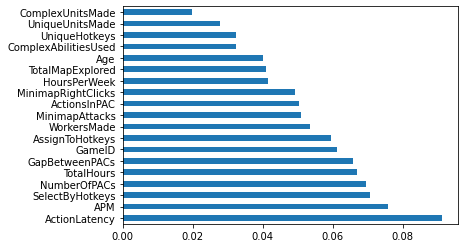

In [ ]:

import matplotlib.pyplot as plt



model = RandomForestClassifier()
model.fit(X,y)
print(model.feature_importances_) #use inbuilt class feature_importances of tree based classifiers

#plot graph of feature importances for better visualization
feat_importances = pd.Series(model.feature_importances_, index=X.columns)
feat_importances.nlargest(19).plot(kind='barh')
plt.show()

## Correlation Matrix with Heatmap

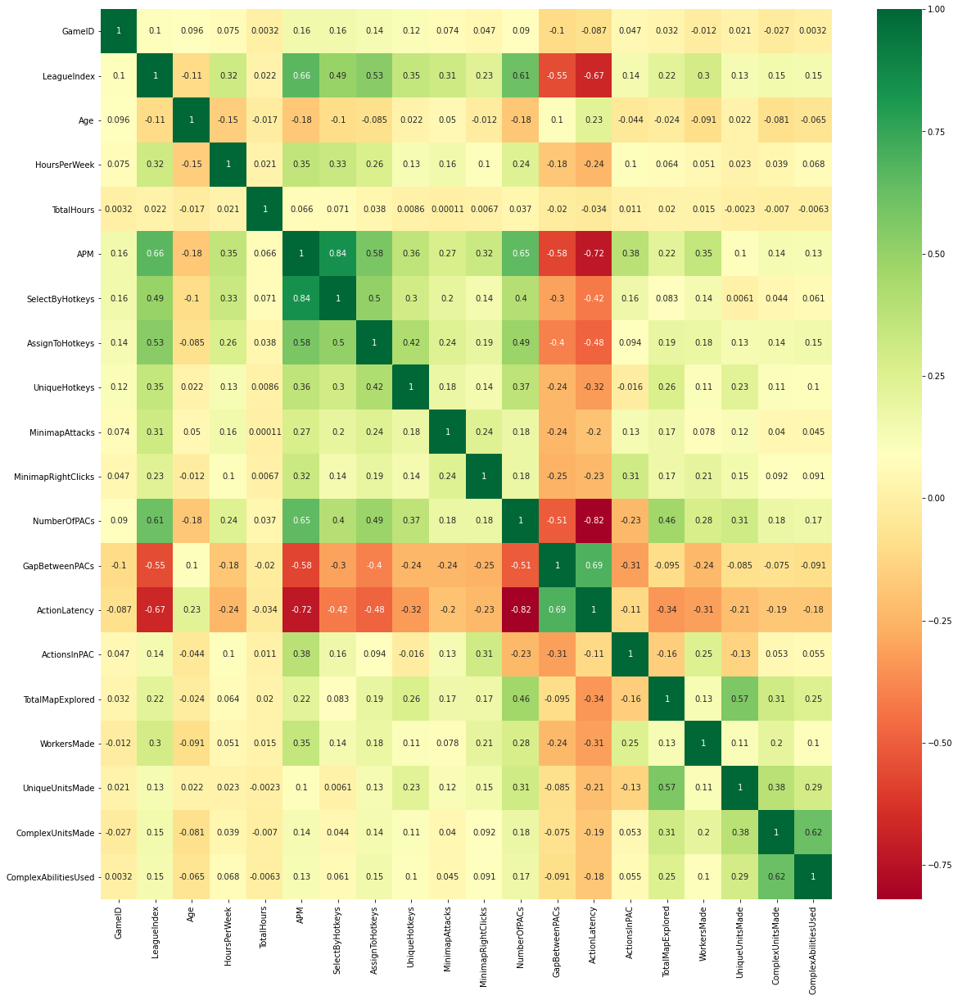

In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
#get correlations of each features in dataset
corrmat = data.corr()
top_corr_features = corrmat.index
plt.figure(figsize=(20,20))
#plot heat map
g=sns.heatmap(data[top_corr_features].corr(),annot=True,cmap="RdYlGn")

## on regarde si le model s'ameliore sans certaines features 

In [ ]:

import pandas as pd
import numpy as np
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2

data1 = pd.read_csv("https://archive.ics.uci.edu/ml/machine-learning-databases/00272/SkillCraft1_Dataset.csv")


# take care of the missing value
data1["Age"] = [None if x=="?" else x for x in data1["Age"]]
data1["HoursPerWeek"] = [None if x=="?" else x for x in data1["HoursPerWeek"]]
data1["TotalHours"] = [None if x=="?" else x for x in data1["TotalHours"]]


grandMaster = data1[data1['LeagueIndex'] == 7 ] # on prend que les grand master

ageGM=grandMaster.Age.value_counts().to_dict()     #on fait comme ça parce que il y a pas de league propre pour les pros du coup les pros sont des grands master
agecommun=0
effectifmax=0
for age,effectif in ageGM.items():
  if effectif>effectifmax:
    effectifmax=effectif
    agecommun=age
#agecommun 

hoursGM=grandMaster.HoursPerWeek.value_counts().to_dict()
hourscommun=0
effectifmax=0
for hours,effectif in hoursGM.items():
  if effectif>effectifmax:
    effectifmax=effectif
    hourscommun=hours
#print(hourscommun)

totGM=grandMaster.TotalHours.value_counts().to_dict()
hourstotcommun=0
effectifmax=0
for hours,effectif in totGM.items():
  if effectif>effectifmax:
    effectifmax=effectif
    hourstotcommun=hours
#print(hourstotcommun)

data1["Age"] = [pd.NaT if x=="?" else x for x in data1["Age"]]
data1["HoursPerWeek"] = [pd.NaT if x=="?" else x for x in data1["HoursPerWeek"]]
data1["TotalHours"] = [pd.NaT if x=="?" else x for x in data1["TotalHours"]]

data1["Age"] = data1.Age.fillna(agecommun)
data1["HoursPerWeek"] = data1.HoursPerWeek.fillna(hourscommun)
data1["TotalHours"] =  data1.TotalHours.fillna(hourstotcommun)


data1.Age=pd.to_numeric(data1.Age)
data1.HoursPerWeek=pd.to_numeric(data1.HoursPerWeek)
data1.TotalHours=pd.to_numeric(data1.TotalHours)


data1=data1.drop(data1[data1.TotalHours == 1000000].index) # on supprime ca parce que c'est une valeure tres tres extreme
data1=data1.drop(data1[data1.GapBetweenPACs >= 230].index)
data1=data1.drop(data1[data1.MinimapAttacks >= 0.0019].index)



In [ ]:
#on vire total hours parce que on vois qu'elle est très peu corrélé avec la feature league index ou des features qui ont pas l'air importante ( on test de retirer ces features parce que c'est ceula qui semblais le plus bancale sur les graphes d'avant )
#data1 = data1.drop('TotalHours',axis=1)             #training set: 0.76  #test set: 0.40     ---> dégradation
data1 = data1.drop('GameID',axis=1)                 #training set: 0.79  #test set: 0.44     ---> amélioration
data1 = data1.drop('ComplexUnitsMade',axis=1)       #training set: 0.79  #test set: 0.45     ---> amélioration
data1 = data1.drop('ComplexAbilitiesUsed',axis=1)   #training set: 0.79  #test set: 0.43     ---> Pas de changement 
data1 = data1.drop('MinimapRightClicks',axis=1)     #training set: 0.79  #test set: 0.43     ---> Pas de changement
data1 = data1.drop('WorkersMade',axis=1)            #training set: 0.79  #test set: 0.43     ---> Pas de changement
data1 = data1.drop('MinimapAttacks',axis=1)         #training set: 0.77  #test set: 0.43     ---> Pas de changement
data1 = data1.drop('UniqueUnitsMade',axis=1)        #training set: 0.78  #test set: 0.44     ---> amélioration
data1 = data1.drop('ActionsInPAC',axis=1)           #training set: 0.79  #test set: 0.44     ---> amélioration
data1 = data1.drop('AssignToHotkeys',axis=1)        #training set: 0.78  #test set: 0.43     ---> Pas de changement





# on test en virant tout ce qui améliore            #training set: 0.78  #test set: 0.43     ---> Pas de changement
# on test en virant tout ce qui améliore et qui change rien    #training set: 0.75  #test set: 0.45     ---> amélioration
# on vire tout                                      #training set: 0.72  #test set: 0.39     ---> dégradation

# on peut retirer les features qui change pas le score car lorsqu'on les retire on garde la meme accuracy, donc elles sont pas nécéssaire au modele 

In [ ]:
feature_names = list(data1.drop('LeagueIndex',axis=1).columns)
Xa1 = data1[feature_names]
ya1 = data1['LeagueIndex']

from sklearn.model_selection import train_test_split
X_trainjv1, X_testjv1, y_trainjv1, y_testjv1 = train_test_split(Xa1, ya1, random_state=0)

#on scale pas parce que les randoms forests n'ont pas besoin d'être scale


In [ ]:
from sklearn.ensemble import RandomForestClassifier

classifier = RandomForestClassifier(max_depth=8, random_state=0)

classifier.fit(X_trainjv1, y_trainjv1)
print('Accuracy of Decision Tree classifier on training set: {:.2f}'
     .format(classifier.score(X_trainjv1, y_trainjv1)))
print('Accuracy of Decision Tree classifier on test set: {:.2f}'
     .format(classifier.score(X_testjv1, y_testjv1)))            #on veux améliorer ce score  #Accuracy of Decision Tree classifier on training set: 0.79
                                                                                              #Accuracy of Decision Tree classifier on test set: 0.43

Accuracy of Decision Tree classifier on training set: 0.75
Accuracy of Decision Tree classifier on test set: 0.45


In [ ]:
classifier.get_params()

{'bootstrap': True,
 'ccp_alpha': 0.0,
 'class_weight': None,
 'criterion': 'gini',
 'max_depth': 8,
 'max_features': 'auto',
 'max_leaf_nodes': None,
 'max_samples': None,
 'min_impurity_decrease': 0.0,
 'min_impurity_split': None,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'n_estimators': 100,
 'n_jobs': None,
 'oob_score': False,
 'random_state': 0,
 'verbose': 0,
 'warm_start': False}

# tune the random forest 

## grid search of the hyperparameters

In [ ]:
from sklearn.ensemble import RandomForestRegressor
rf = RandomForestRegressor(random_state = 42)

from pprint import pprint
# Look at parameters used by our current forest
print('Parameters currently in use:\n')
pprint(rf.get_params())

# to see the parameter the random forest use 
# the most important is the number of trees in the forest (n_estimators) and the number of features considered for splitting at each leaf node (max_features)


Parameters currently in use:

{'bootstrap': True,
 'ccp_alpha': 0.0,
 'criterion': 'mse',
 'max_depth': None,
 'max_features': 'auto',
 'max_leaf_nodes': None,
 'max_samples': None,
 'min_impurity_decrease': 0.0,
 'min_impurity_split': None,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'n_estimators': 100,
 'n_jobs': None,
 'oob_score': False,
 'random_state': 42,
 'verbose': 0,
 'warm_start': False}


We will try adjusting the following set of hyperparameters:


*   n_estimators = number of trees in the foreset
*   max_features = max number of features considered for splitting a node
*   max_depth = max number of levels in each decision tree
*   min_samples_split = min number of data points placed in a node before the node is split
*   min_samples_leaf = min number of data points allowed in a leaf node
*   bootstrap = method for sampling data points (with or without replacement)





In [ ]:
from sklearn.model_selection import RandomizedSearchCV # on fais d'abord random sur un assez gros echantillon

# Number of trees in random forest
n_estimators = [int(x) for x in np.linspace(start = 200, stop = 2000, num = 10)]

# Number of features to consider at every split
max_features = ['auto', 'sqrt']

# Maximum number of levels in tree
max_depth = [int(x) for x in np.linspace(10, 110, num = 11)]
max_depth.append(None)

# Minimum number of samples required to split a node
min_samples_split = [2, 5, 10]

# Minimum number of samples required at each leaf node
min_samples_leaf = [1, 2, 4]

# Method of selecting samples for training each tree
bootstrap = [True, False]

# Create the random grid
random_grid = {'n_estimators': n_estimators,
               'max_features': max_features,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf,
               'bootstrap': bootstrap}

pprint(random_grid) # we will try to see wich of thoses parameters are the best for our model

{'bootstrap': [True, False],
 'max_depth': [10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110, None],
 'max_features': ['auto', 'sqrt'],
 'min_samples_leaf': [1, 2, 4],
 'min_samples_split': [2, 5, 10],
 'n_estimators': [200, 400, 600, 800, 1000, 1200, 1400, 1600, 1800, 2000]}


#Random Search Training

In [ ]:
# Use the random grid to search for best hyperparameters
# First create the base model to tune
rf = RandomForestRegressor()
# Random search of parameters, using 3 fold cross validation, 
# search across 100 different combinations, and use all available cores
rf_random = RandomizedSearchCV(estimator = rf, param_distributions = random_grid, n_iter = 100, cv = 3, verbose=2, random_state=42, n_jobs = -1)
# Fit the random search model
rf_random.fit(X_trainjv1, y_trainjv1)

Fitting 3 folds for each of 100 candidates, totalling 300 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  3.8min
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed: 16.0min
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed: 29.8min finished


RandomizedSearchCV(cv=3, error_score=nan,
                   estimator=RandomForestRegressor(bootstrap=True,
                                                   ccp_alpha=0.0,
                                                   criterion='mse',
                                                   max_depth=None,
                                                   max_features='auto',
                                                   max_leaf_nodes=None,
                                                   max_samples=None,
                                                   min_impurity_decrease=0.0,
                                                   min_impurity_split=None,
                                                   min_samples_leaf=1,
                                                   min_samples_split=2,
                                                   min_weight_fraction_leaf=0.0,
                                                   n_estimators=100,
                              

In [ ]:
rf_random.best_params_


{'bootstrap': True,
 'max_depth': 10,
 'max_features': 'sqrt',
 'min_samples_leaf': 1,
 'min_samples_split': 5,
 'n_estimators': 2000}

In [ ]:
def evaluate(model, test_features, test_labels):
    predictions = model.predict(test_features)
    errors = abs(predictions - test_labels)
    mape = 100 * np.mean(errors / test_labels)
    accuracy = 100 - mape
    print('Model Performance')
    print('Average Error: {:0.4f} degrees.'.format(np.mean(errors)))
    print('Accuracy = {:0.2f}%.'.format(accuracy))
    
    return accuracy
base_model = RandomForestRegressor(n_estimators = 10, random_state = 42)
base_model.fit(X_trainjv1, y_trainjv1)
base_accuracy = evaluate(base_model, X_testjv1, y_testjv1) # la c'est l'accuratie pas le R2 comme avant 


Model Performance
Average Error: 0.7727 degrees.
Accuracy = 74.83%.


In [ ]:
base_model.score(X_testjv1, y_testjv1) # la c'est le R2

0.5979407800369643

In [ ]:
best_random = rf_random.best_estimator_
random_accuracy = evaluate(best_random, X_testjv1, y_testjv1)


Model Performance
Average Error: 0.7368 degrees.
Accuracy = 75.47%.


In [ ]:
best_random.score(X_testjv1, y_testjv1)

0.6367828410699029

In [ ]:
print('Improvement of {:0.2f}%.'.format( 100 * (random_accuracy - base_accuracy) / base_accuracy))


Improvement of 0.86%.


## Grid Search with Cross Validation

In [ ]:
rf_random.best_params_


{'bootstrap': True,
 'max_depth': 10,
 'max_features': 'sqrt',
 'min_samples_leaf': 1,
 'min_samples_split': 5,
 'n_estimators': 2000}

In [ ]:
from sklearn.model_selection import GridSearchCV

# Create the parameter grid based on the results of random search 
param_grid = {
    'bootstrap': [True],
    'max_depth': [10, 15, 20, 25],
    'max_features': [3, 4], # parce que le meilleurs c'est le sqrt
    'min_samples_leaf': [1, 2, 3],
    'min_samples_split': [4, 5, 6],
    'n_estimators': [1600,2000,2200,2500]
}
# Create a based model
rf = RandomForestRegressor()
# Instantiate the grid search model
grid_search = GridSearchCV(estimator = rf, param_grid = param_grid, 
                          cv = 3, n_jobs = -1, verbose = 2)

In [ ]:
# Fit the grid search to the data
grid_search.fit(X_trainjv1, y_trainjv1)
grid_search.best_params_


Fitting 3 folds for each of 288 candidates, totalling 864 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  3.4min
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed: 15.3min
[Parallel(n_jobs=-1)]: Done 361 tasks      | elapsed: 36.9min
[Parallel(n_jobs=-1)]: Done 644 tasks      | elapsed: 68.6min
[Parallel(n_jobs=-1)]: Done 864 out of 864 | elapsed: 93.0min finished


{'bootstrap': True,
 'max_depth': 10,
 'max_features': 4,
 'min_samples_leaf': 2,
 'min_samples_split': 6,
 'n_estimators': 2000}

In [ ]:
grid_search.best_params_

{'bootstrap': True,
 'max_depth': 10,
 'max_features': 4,
 'min_samples_leaf': 2,
 'min_samples_split': 6,
 'n_estimators': 2000}

In [ ]:
best_grid = grid_search.best_estimator_ # best estimator, we choose that
grid_accuracy = evaluate(best_grid, X_testjv1, y_testjv1)


Model Performance
Average Error: 0.7356 degrees.
Accuracy = 75.57%.


In [ ]:
print('Improvement of {:0.2f}%.'.format( 100 * (grid_accuracy - base_accuracy) / base_accuracy))


Improvement of 0.99%.


In [ ]:
best_grid.get_params()

{'bootstrap': True,
 'ccp_alpha': 0.0,
 'criterion': 'mse',
 'max_depth': 10,
 'max_features': 4,
 'max_leaf_nodes': None,
 'max_samples': None,
 'min_impurity_decrease': 0.0,
 'min_impurity_split': None,
 'min_samples_leaf': 2,
 'min_samples_split': 6,
 'min_weight_fraction_leaf': 0.0,
 'n_estimators': 2000,
 'n_jobs': None,
 'oob_score': False,
 'random_state': None,
 'verbose': 0,
 'warm_start': False}

# On importe notre model grace à joblib

In [ ]:
from sklearn.externals import joblib
joblib.dump(best_grid,'model_joblib')

/usr/local/lib/python3.6/dist-packages/sklearn/externals/joblib/__init__.py:15: FutureWarning: sklearn.externals.joblib is deprecated in 0.21 and will be removed in 0.23. Please import this functionality directly from joblib, which can be installed with: pip install joblib. If this warning is raised when loading pickled models, you may need to re-serialize those models with scikit-learn 0.21+.
  warnings.warn(msg, category=FutureWarning)


['model_joblib']